## Модель, обученная на логарифмах глубин

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
params_list = []
val_losses = []
for solver_name in ['adam', 'sgd', 'sgd_momentum']:
    for lr in [1e-5, 1e-4, 1e-3]:
        for decay in [1e-6, 1e-5, 1e-4]:
            save_dir = '/home/kmouraviev/FCRN_notebooks/train_log_depth_{}_lr{}_decay{}'.format(solver_name,
                                                                                                lr,
                                                                                                decay
                                                                                               )
            try:
                params = {
                    'solver': solver_name,
                    'lr': lr,
                    'decay': decay
                }
                params_list.append(params)
                val_loss = np.loadtxt(os.path.join(save_dir, 'val_losses.txt'))
                val_losses.append(val_loss)
            except:
                continue

In [3]:
val_losses = np.array(val_losses)

In [4]:
min_losses = [x.min() for x in val_losses]

In [5]:
best_log_result = np.argmin(val_losses)

In [6]:
best_log_experiment = best_log_result // val_losses.shape[1]
best_epoch = best_log_result % val_losses.shape[1]

In [7]:
best_params = params_list[best_log_experiment]

In [8]:
model_dir = '/home/kmouraviev/FCRN_notebooks/train_log_depth_{}_lr{}_decay{}'.format(best_params['solver'],
                                                                                     best_params['lr'],
                                                                                     best_params['decay']
                                                                                     )
model_path = os.path.join(model_dir, 'model_on_epoch{}.hdf5'.format(best_epoch + 1))

In [9]:
from keras.models import load_model
log_model = load_model(model_path)

Using TensorFlow backend.


## Обычная модель

In [10]:
params_list = []
val_losses = []
for solver_name in ['adam', 'rmsprop', 'sgd', 'sgd_momentum']:
    for lr in [1e-5, 3e-5, 1e-4, 3e-4, 1e-3]:
        for decay in [1e-6, 1e-5, 1e-4]:
            save_dir = '/home/kmouraviev/FCRN_notebooks/finetune_{}_lr{}_decay{}'.format(solver_name,
                                                                                                lr,
                                                                                                decay
                                                                                               )
            try:
                params = {
                    'solver': solver_name,
                    'lr': lr,
                    'decay': decay
                }
                params_list.append(params)
                val_loss = np.loadtxt(os.path.join(save_dir, 'val_losses.txt'))
                assert len(val_loss) == 20
                val_losses.append(val_loss)
            except:
                continue

In [11]:
val_losses = np.array(val_losses)

In [12]:
min_losses = [x.min() for x in val_losses]

In [13]:
best_result = np.argmin(val_losses)

In [14]:
best_experiment = best_result // val_losses.shape[1]
best_epoch = best_result % val_losses.shape[1]

In [15]:
best_params = params_list[best_experiment]

In [16]:
model_dir = '/home/kmouraviev/FCRN_notebooks/finetune_{}_lr{}_decay{}'.format(best_params['solver'],
                                                                                     best_params['lr'],
                                                                                     best_params['decay']
                                                                                     )
model_path = os.path.join(model_dir, 'model_on_epoch{}.hdf5'.format(best_epoch + 1))

In [17]:
from keras.models import load_model
usual_model = load_model(model_path)

## Валидационный датасет

In [18]:
from keras.models import load_model
import h5py

In [19]:
dataset = h5py.File('/home/kmouraviev/NYU_dataset_hdf5/data.hdf5', 'r')
rgbs = dataset['data']
depths = dataset['label']

In [20]:
rgbs_val = rgbs[50000::100]
depths_val = depths[50000::100]

In [21]:
def unpreprocess(image):
    img_min = -123
    img_max = 151
    return (image - img_min) / (img_max - img_min)

In [22]:
log_model_predictions = np.exp(log_model.predict(rgbs_val) - 1e-2)
usual_model_predictions = usual_model.predict(rgbs_val)

## Визуализация

Посмотрим на предсказанные карты глубин для 66 изображений из валидационной выборки

### Первая половина

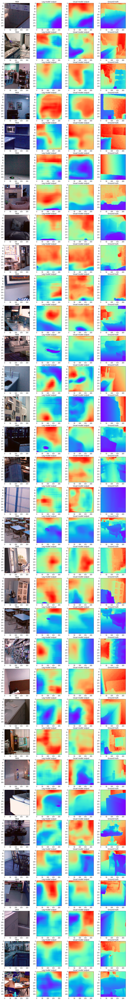

In [28]:
n = 33
plt.figure(figsize=(16, 4 * n))
for i in range(n):
    plt.subplot(n, 4, i * 4 + 1)
    plt.title('RGB', fontsize=12)
    plt.imshow(unpreprocess(rgbs_val[i]))
    
    plt.subplot(n, 4, i * 4 + 2)
    plt.title('Log model output', fontsize=12)
    plt.imshow(log_model_predictions[i] / 10., cmap='rainbow')
    
    plt.subplot(n, 4, i * 4 + 3)
    plt.title('Usual model output', fontsize=12)
    plt.imshow(usual_model_predictions[i] / 10., cmap='rainbow')
    
    plt.subplot(n, 4, i * 4 + 4)
    plt.title('Ground truth', fontsize=12)
    plt.imshow(depths_val[i] / 10., cmap='rainbow')

### Вторая половина

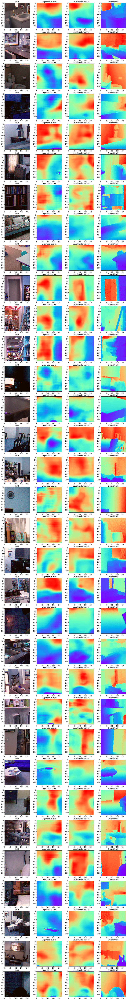

In [29]:
n = 33
plt.figure(figsize=(16, 4 * n))
for i in range(n):
    plt.subplot(n, 4, i * 4 + 1)
    plt.title('RGB', fontsize=12)
    plt.imshow(unpreprocess(rgbs_val[33:][i]))
    
    plt.subplot(n, 4, i * 4 + 2)
    plt.title('Log model output', fontsize=12)
    plt.imshow(log_model_predictions[33:][i] / 10., cmap='rainbow')
    
    plt.subplot(n, 4, i * 4 + 3)
    plt.title('Usual model output', fontsize=12)
    plt.imshow(usual_model_predictions[33:][i] / 10., cmap='rainbow')
    
    plt.subplot(n, 4, i * 4 + 4)
    plt.title('Ground truth', fontsize=12)
    plt.imshow(depths_val[33:][i] / 10., cmap='rainbow')